In [2]:
#hide
!pip install -Uqq fastbook
import fastbook
fastbook.setup_book()

     |████████████████████████████████| 727kB 12.2MB/s 
     |████████████████████████████████| 194kB 32.3MB/s 
     |████████████████████████████████| 51kB 6.7MB/s 
     |████████████████████████████████| 1.2MB 35.0MB/s 
     |████████████████████████████████| 12.8MB 241kB/s 
     |████████████████████████████████| 61kB 7.2MB/s 
     |████████████████████████████████| 776.8MB 22kB/s 
     |████████████████████████████████| 51kB 7.2MB/s 
ERROR: torchtext 0.9.1 has requirement torch==1.8.1, but you'll have torch 1.7.1 which is incompatible.
Mounted at /content/gdrive


In [3]:
#hide
from fastbook import *
from fastai.vision.widgets import *

[[chapter_production]]

In [4]:
key = os.environ.get('AZURE_SEARCH_KEY', '03dc7ef6444e4750ade371c6e0ff0fe8')

In [5]:
search_images_bing

<function fastbook.search_images_bing>

In [39]:
results = search_images_bing('03dc7ef6444e4750ade371c6e0ff0fe8', 'mushrooms')
ims = results.attrgot('contentUrl')
len(ims)
print(ims)

['http://blogs.cornell.edu/mushrooms/files/2014/02/DSCN4343-1634jb9.jpg', 'https://cdn.britannica.com/03/180803-050-11B5EAE5/skullcaps-mushrooms-autumn-skullcap.jpg', 'https://www.myfreetextures.com/wp-content/uploads/2014/11/lots-of-mushrooms.jpg', 'https://files.shroomery.org/files/08-42/435036559-Psilocybe_cyanescens_3.jpg', 'http://www.craftygeek.co.uk/wp-content/uploads/2013/09/mushrrom_crowd.jpg', 'https://i.redd.it/l75394b9wen11.jpg', 'https://upload.wikimedia.org/wikipedia/commons/thumb/2/2d/Pleurotus_ostreatus_-_Pleurote_en_hu%C3%AEtre.jpg/1200px-Pleurotus_ostreatus_-_Pleurote_en_hu%C3%AEtre.jpg', 'https://cff2.earth.com/uploads/2017/11/27132038/California-could-legalize-psychedelic-mushrooms-next-year.jpg?v=2', 'https://4.bp.blogspot.com/-z1X8dcU5Z2s/Tsr2cBABbbI/AAAAAAAAEWY/eoGmObVclAg/s1600/IMG_4716.jpg', 'https://wildmushroomhunting.org/uploads/monthly_2019_05/0501191646.jpg.e5d7f5720a58bb9bf97f7ee81dd6f662.jpg', 'https://i2.wp.com/bdn-data.s3.amazonaws.com/uploads/2018/09/

In [42]:
#hide
ims = ['http://3.bp.blogspot.com/-S1scRCkI3vY/UHzV2kucsPI/AAAAAAAAA-k/YQ5UzHEm9Ss/s1600/Grizzly%2BBear%2BWildlife.jpg']

In [43]:
dest = 'images/mushrooms.jpg'
download_url(ims[0], dest)

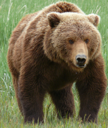

In [44]:
im = Image.open(dest)
im.to_thumb(128,128)

In [9]:
mushrooms_types = 'fly-agaric','oyster-mushrooms','honey-mushrooms'
path = Path('mushrooms')

In [10]:
if not path.exists():
    path.mkdir()
    for o in mushrooms_types:
        dest = (path/o)
        dest.mkdir(exist_ok=True)
        results = search_images_bing(key, f'{o} mushrooms')
        download_images(dest, urls=results.attrgot('contentUrl'))

In [12]:
fns = get_image_files(path)
fns

(#401) [Path('mushrooms/honey-mushrooms/00000026.jpg'),Path('mushrooms/honey-mushrooms/00000068.jpg'),Path('mushrooms/honey-mushrooms/00000147.jpg'),Path('mushrooms/honey-mushrooms/00000135.jpg'),Path('mushrooms/honey-mushrooms/00000063.jpg'),Path('mushrooms/honey-mushrooms/00000089.jpg'),Path('mushrooms/honey-mushrooms/00000008.jpg'),Path('mushrooms/honey-mushrooms/00000024.jpg'),Path('mushrooms/honey-mushrooms/00000134.jpg'),Path('mushrooms/honey-mushrooms/00000101.jpg')...]

In [13]:
failed = verify_images(fns)
failed

(#2) [Path('mushrooms/fly-agaric/00000120.jpg'),Path('mushrooms/oyster-mushrooms/00000009.jpg')]

In [14]:
failed.map(Path.unlink);

### Sidebar: Getting Help in Jupyter Notebooks

Jupyter notebooks are great for experimenting and immediately seeing the results of each function, but there is also a lot of functionality to help you figure out how to use different functions, or even directly look at their source code. For instance, if you type in a cell:
```
??verify_images
```
a window will pop up with:
```
Signature: verify_images(fns)
Source:   
def verify_images(fns):
    "Find images in `fns` that can't be opened"
    return L(fns[i] for i,o in
             enumerate(parallel(verify_image, fns)) if not o)
File:      ~/git/fastai/fastai/vision/utils.py
Type:      function
```
This tells us what argument the function accepts (`fns`), then shows us the source code and the file it comes from. Looking at that source code, we can see it applies the function `verify_image` in parallel and only keeps the image files for which the result of that function is `False`, which is consistent with the doc string: it finds the images in `fns` that can't be opened.

Here are some other features that are very useful in Jupyter notebooks:

- At any point, if you don't remember the exact spelling of a function or argument name, you can press Tab to get autocompletion suggestions.
- When inside the parentheses of a function, pressing Shift and Tab simultaneously will display a window with the signature of the function and a short description. Pressing these keys twice will expand the documentation, and pressing them three times will open a full window with the same information at the bottom of your screen.
- In a cell, typing `?func_name` and executing will open a window with the signature of the function and a short description.
- In a cell, typing `??func_name` and executing will open a window with the signature of the function, a short description, and the source code.
- If you are using the fastai library, we added a `doc` function for you: executing `doc(func_name)` in a cell will open a window with the signature of the function, a short description and links to the source code on GitHub and the full documentation of the function in the [library docs](https://docs.fast.ai).
- Unrelated to the documentation but still very useful: to get help at any point if you get an error, type `%debug` in the next cell and execute to open the [Python debugger](https://docs.python.org/3/library/pdb.html), which will let you inspect the content of every variable.

One thing to be aware of in this process: as we discussed in <<chapter_intro>>, models can only reflect the data used to train them. And the world is full of biased data, which ends up reflected in, for example, Bing Image Search (which we used to create our dataset). For instance, let's say you were interested in creating an app that could help users figure out whether they had healthy skin, so you trained a model on the results of searches for (say) "healthy skin." <<healthy_skin>> shows you the kinds of results you would get.

<img src="https://github.com/fastai/fastbook/blob/master/images/healthy_skin.gif?raw=1" width="600" caption="Data for a healthy skin detector?" id="healthy_skin">

With this as your training data, you would end up not with a healthy skin detector, but a *young white woman touching her face* detector! Be sure to think carefully about the types of data that you might expect to see in practice in your application, and check carefully to ensure that all these types are reflected in your model's source data. footnote:[Thanks to Deb Raji, who came up with the "healthy skin" example. See her paper ["Actionable Auditing: Investigating the Impact of Publicly Naming Biased Performance Results of Commercial AI Products"](https://dl.acm.org/doi/10.1145/3306618.3314244) for more fascinating insights into model bias.]

Now that we have downloaded some data, we need to assemble it in a format suitable for model training. In fastai, that means creating an object called `DataLoaders`.

## From Data to DataLoaders

In [16]:
mushrooms = DataBlock(
    blocks=(ImageBlock, CategoryBlock), 
    get_items=get_image_files, 
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(128))

In [18]:
dls = mushrooms.dataloaders(path)

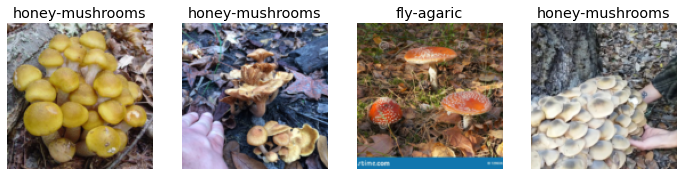

In [19]:
dls.valid.show_batch(max_n=4, nrows=1)

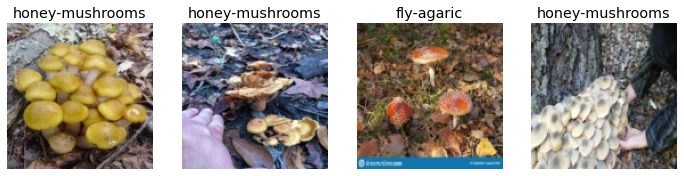

In [20]:
mushrooms = mushrooms.new(item_tfms=Resize(128, ResizeMethod.Squish))
dls = mushrooms.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)

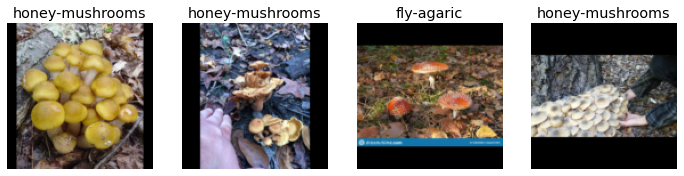

In [21]:
mushrooms = mushrooms.new(item_tfms=Resize(128, ResizeMethod.Pad, pad_mode='zeros'))
dls = mushrooms.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)

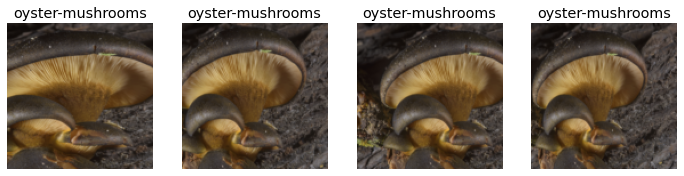

In [22]:
mushrooms = mushrooms.new(item_tfms=RandomResizedCrop(128, min_scale=0.3))
dls = mushrooms.dataloaders(path)
dls.train.show_batch(max_n=4, nrows=1, unique=True)

### Data Augmentation

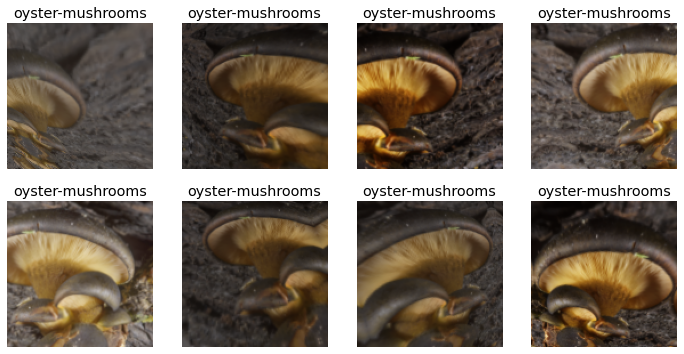

In [23]:
mushrooms = mushrooms.new(item_tfms=Resize(128), batch_tfms=aug_transforms(mult=2))
dls = mushrooms.dataloaders(path)
dls.train.show_batch(max_n=8, nrows=2, unique=True)

Now that we have assembled our data in a format fit for model training, let's actually train an image classifier using it.

In [24]:
mushrooms = mushrooms.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())
dls = mushrooms.dataloaders(path)

In [26]:
learn = cnn_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(4)

Downloading: "https://download.pytorch.org/models/resnet18-5c106cde.pth" to /root/.cache/torch/hub/checkpoints/resnet18-5c106cde.pth


epoch,train_loss,valid_loss,error_rate,time
0,1.622131,0.313490,0.101266,01:12


epoch,train_loss,valid_loss,error_rate,time
0,0.594779,0.175987,0.037975,01:29
1,0.445430,0.072521,0.012658,01:30
2,0.356147,0.051997,0.012658,01:30
3,0.288504,0.045806,0.012658,01:29


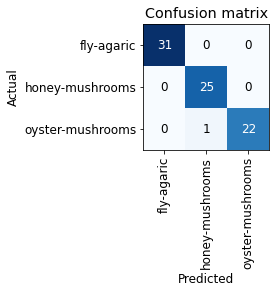

In [27]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

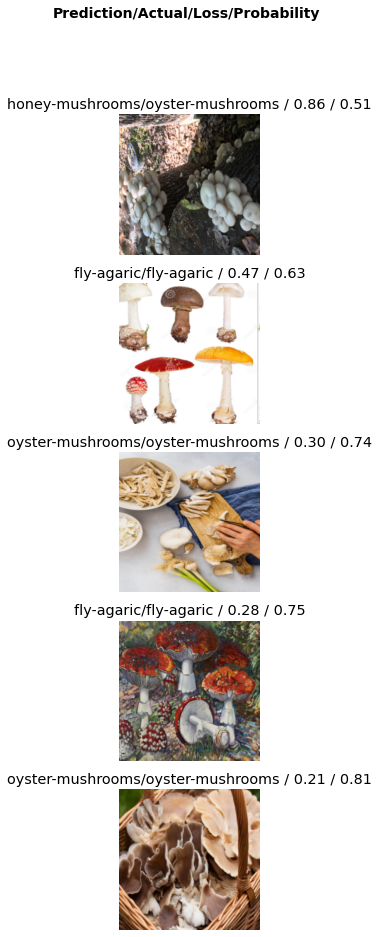

In [28]:
interp.plot_top_losses(5, nrows=5)

In [ ]:
#hide_output
cleaner = ImageClassifierCleaner(learn)
cleaner

In [ ]:
#hide
for idx in cleaner.delete(): cleaner.fns[idx].unlink()


In [29]:
learn.export()

In [33]:
path = Path()
path.ls(file_exts='.pkl')

(#1) [Path('export.pkl')]

In [34]:
learn_inf = load_learner(path/'export.pkl')

In [45]:
learn_inf.predict('images/mushrooms.jpg')

('honey-mushrooms', tensor(1), tensor([5.6414e-04, 7.9332e-01, 2.0612e-01]))

In [46]:
learn_inf.dls.vocab

['fly-agaric', 'honey-mushrooms', 'oyster-mushrooms']

### Creating a Notebook App from the Model

In [47]:
#hide_output
btn_upload = widgets.FileUpload()
btn_upload

FileUpload(value={}, description='Upload')

In [57]:
#hide
# For the book, we can't actually click an upload button, so we fake it
btn_upload = SimpleNamespace(data = ['images/mushrooms.jpg'])

In [58]:
img = PILImage.create(btn_upload.data[-1])

<img alt="Output widget representing the image" width="117" src="https://github.com/fastai/fastbook/blob/master/images/att_00009.png?raw=1">

In [59]:
#hide_output
out_pl = widgets.Output()
out_pl.clear_output()
with out_pl: display(img.to_thumb(128,128))
out_pl

Output()

In [60]:
pred,pred_idx,probs = learn_inf.predict(img)

In [61]:
#hide_output
lbl_pred = widgets.Label()
lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'
lbl_pred

Label(value='Prediction: honey-mushrooms; Probability: 0.7933')

In [62]:
#hide_output
btn_run = widgets.Button(description='Classify')
btn_run

Button(description='Classify', style=ButtonStyle())

In [63]:
def on_click_classify(change):
    img = PILImage.create(btn_upload.data[-1])
    out_pl.clear_output()
    with out_pl: display(img.to_thumb(128,128))
    pred,pred_idx,probs = learn_inf.predict(img)
    lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'

btn_run.on_click(on_click_classify)

In [64]:
#hide
#Putting back btn_upload to a widget for next cell
btn_upload = widgets.FileUpload()

In [65]:
#hide_output
VBox([widgets.Label('Select your mushroom!'), 
      btn_upload, btn_run, out_pl, lbl_pred])

<img alt="The whole widget" width="233" src="https://github.com/fastai/fastbook/blob/master/images/att_00011.png?raw=1">

We have written all the code necessary for our app. The next step is to convert it into something we can deploy.

### Turning Your Notebook into a Real App

In [66]:
#hide
!pip install voila
!jupyter serverextension enable --sys-prefix voila 

     |████████████████████████████████| 1.6MB 12.8MB/s 
     |████████████████████████████████| 378kB 45.9MB/s 
     |████████████████████████████████| 552kB 48.8MB/s 
     |████████████████████████████████| 122kB 36.6MB/s 
     |████████████████████████████████| 71kB 8.1MB/s 
     |████████████████████████████████| 430kB 46.1MB/s 
ERROR: nbdev 1.1.14 has requirement nbconvert<6, but you'll have nbconvert 6.0.7 which is incompatible.
ERROR: google-colab 1.0.0 has requirement tornado~=5.1.0; python_version >= "3.0", but you'll have tornado 6.1 which is incompatible.
  Found existing installation: nbconvert 5.6.1
    Uninstalling nbconvert-5.6.1:
      Successfully uninstalled nbconvert-5.6.1
  Found existing installation: tornado 5.1.1
    Uninstalling tornado-5.1.1:
      Successfully uninstalled tornado-5.1.1
  Found existing installation: jupyter-client 5.3.5
    Uninstalling jupyter-client-5.3.5:
      Successfully uninstalled jupyter-client-5.3.5


Enabling: voila
- Writing config: /usr/etc/jupyter
    - Validating...
Error loading server extension voila
      X is voila importable?


For at least the initial prototype of your application, and for any hobby projects that you want to show off, you can easily host them for free. The best place and the best way to do this will vary over time, so check the [book's website](https://book.fast.ai/) for the most up-to-date recommendations. As we're writing this book in early 2020 the simplest (and free!) approach is to use [Binder](https://mybinder.org/). To publish your web app on Binder, you follow these steps:

1. Add your notebook to a [GitHub repository](http://github.com/).
2. Paste the URL of that repo into Binder's URL, as shown in <<deploy-binder>>.
3. Change the File dropdown to instead select URL.
4. In the "URL to open" field, enter `/voila/render/name.ipynb` (replacing `name` with the name of for your notebook).
5. Click the clickboard button at the bottom right to copyt the URL and paste it somewhere safe. 
6. Click Launch.

<img alt="Deploying to Binder" width="800" caption="Deploying to Binder" id="deploy-binder" src="https://github.com/fastai/fastbook/blob/master/images/att_00001.png?raw=1">